In [1]:
import os
import obspy
from obspy.core.stream import Stream
from obspy import read_inventory
from obspy.core import UTCDateTime
from obspy.clients.fdsn import Client
from obspy.clients.fdsn.header import URL_MAPPINGS
from obspy.geodetics import gps2dist_azimuth
from obspy import read
from pathlib import Path

import matplotlib
import matplotlib.pyplot as plt
import math
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from scipy import signal
from scipy.fft import fftshift
import sqlite3
from prelude import *

# Looking for events inside of an example window.

In [2]:
event_start = UTCDateTime(2019,2,12)
event_end = UTCDateTime(2019,2,17)

In [3]:
print(UTCDateTime(2019,2,13).timestamp)
print(UTCDateTime(2019,3,26).timestamp)

1550016000.0
1553558400.0


## Downloading events inside of above range from IRIS with magnitude higher then 3.0

In [4]:

client = Client("IRIS")

cat = client.get_events(starttime=event_start,endtime=event_end,minmagnitude=3.0)
print(cat)

232 Event(s) in Catalog:
2019-02-16T23:22:23.770000Z | +54.839, +163.268 | 4.1  mb
2019-02-16T23:10:21.620000Z | -12.114,  -74.206 | 4.3  mb
...
2019-02-12T01:45:38.348000Z | +69.544, -144.867 | 3.2  ML
2019-02-12T01:32:27.980000Z | +14.462,  +85.733 | 4.9  mb
To see all events call 'print(CatalogObject.__str__(print_all=True))'


In [5]:
def plot_catalog(cat):
    ax = plt.axes(projection = ccrs.PlateCarree())
    print(ccrs.PlateCarree())
    ax.stock_img()
    ax.set_xlim(left=-167,right=-123)
    ax.set_ylim(bottom = 46, top = 73)
    lat = []
    lon = []
    for e in cat:
    #print(e)
    #print(e["origins"])
        for o in e["origins"]:
            lat.append(o.latitude)
            lon.append(o.longitude)
        
        #print("lat: {} lon: {}".format(o.latitude,o.longitude))
    plt.scatter(lon,lat,transform=ccrs.PlateCarree())
#plt.scatter([64.2],[-147.32],transform=ccrs.PlateCarree())
    plt.scatter([-147.32],[64.2],transform=ccrs.PlateCarree())
    plt.show()

## Plotting all Events inside of Alaska

4 Event(s) in Catalog:
2019-02-16T22:35:07.276000Z | +69.486, -144.073 | 4.0  ml
2019-02-15T22:57:31.709000Z | +66.302, -157.227 | 3.6  ml
2019-02-12T19:06:19.270000Z | +65.550, -166.815 | 3.8  ml
2019-02-12T11:11:34.932000Z | +61.273, -149.930 | 3.7  ML


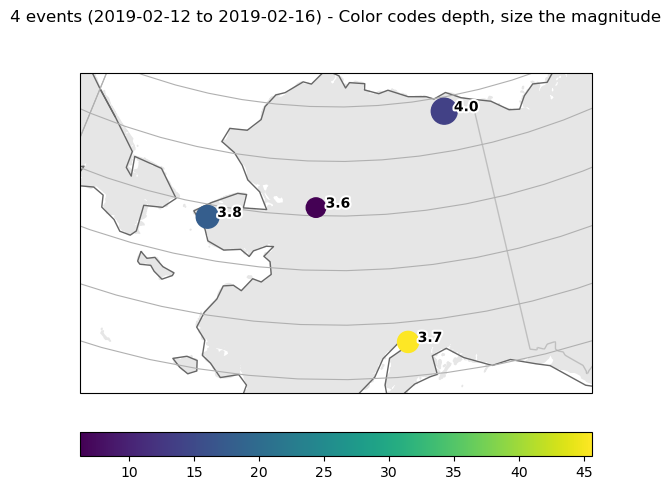

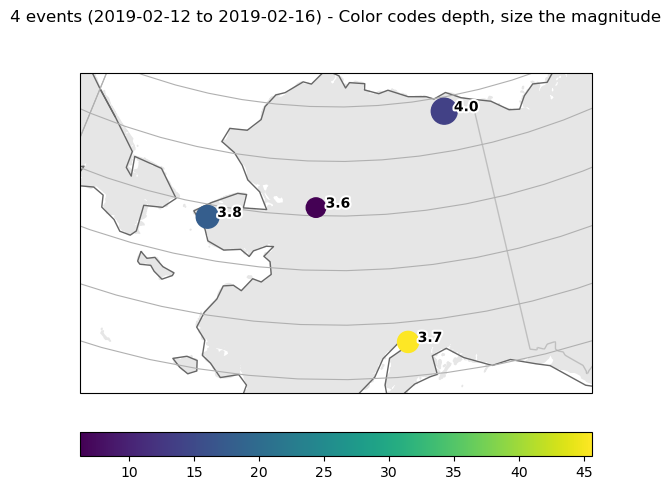

In [6]:
cat_new = cat.filter("longitude >= -167","longitude <= -123","latitude >= 54","magnitude >= 3.6")
print(cat_new)
cat_new.plot(projection="local")
#cat_new.plot(projection="local")

## Plotting a map of all stations in network

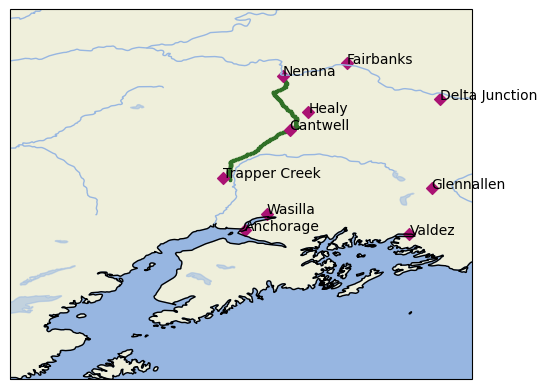

In [7]:
def parse_cities_table():
    p = Path("/home/admin/share/datalib/cities_roads_etc/cities/alaska/census2010/AK_Places_Table.txt")
    f = open(p,"r")
    next(f)
    list_out = {}
    for l in f:
        split = l.split("\t")
        name = split[0]
        ty = split[1].strip()
        lat = float(split[4].strip())
        lon = float(split[3].strip())

        city = {"name":name,"type":ty,"lat":lat,"lon":lon}
        list_out[name] = city
    return list_out

    
ax = plt.axes(projection=ccrs.PlateCarree())
#ax.stock_img()
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)
ax.set_extent([-155,-145,58,66])
cities = parse_cities_table()
city_names = {"Fairbanks","Nenana","Delta Junction","Wasilla",
              "Cantwell","Healy","Trapper Creek","Anchorage","Valdez","Glennallen"}

for net in STATIONS:
    #print(net)
    for s in net:
        lat = s.latitude
        lon = s.longitude
        code=s.code
        plt.scatter(lon,lat,transform=ccrs.PlateCarree(),c="#307027",marker="x",s=3.0)
        #print("lat: {}, lon: {}, code: {}".format(lat,lon,code))
        #print(s)
for city_name in cities:
    city = cities[city_name]
    #print("{}: {}".format(city["name"],city["type"]))
    #if city["type"]=="City":
    
    if city["name"] in city_names:
        plt.scatter(city["lon"],city["lat"],transform=ccrs.PlateCarree(),c="#aa1273",marker="D")
        plt.annotate(city["name"],(city["lon"],city["lat"]),transform=ccrs.PlateCarree())
plt.savefig("assets/stations.png")
plt.show()


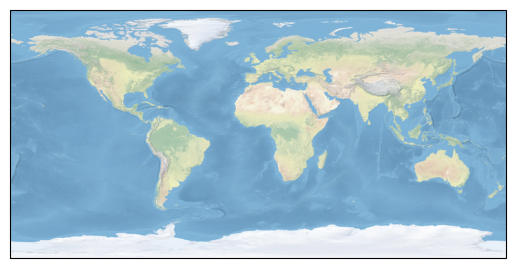

In [8]:
ax = plt.axes(projection=ccrs.PlateCarree())

ax.stock_img()
plt.show()

In [9]:
# may need to chage path to where downloaded data is.
stations= read_inventory("/scratch/naalexeev/NODAL/stations.xml")
def get_streams(event_time,event_lat,event_lon,buffer_time=60.0,max_dist = 130000.0):
    data_path = Path("/scratch/naalexeev/NODAL")


    selected_traces = []
    for file in data_path.iterdir():
        if not file.name in bad_files():

            stem_split = file.stem.split(".")
  
            start_time = UTCDateTime(stem_split[0]+"."+stem_split[1])
            end_time = UTCDateTime(stem_split[2]+"."+stem_split[3])
            read_start = event_time-buffer_time
            read_end = event_time+buffer_time
           
            if start_time<event_time and end_time>event_time:
                read_path = data_path/file
                #print(read_path)
                stream = read(str(read_path),starttime = read_start,endtime = read_end)
                for tr in stream:
                    #rint(tr.stats)
                    seed_id = "{}.{}..{}".format(tr.stats["network"],
                                                 tr.stats["station"],
                                                 tr.stats["channel"])
                    coords = stations.get_coordinates(seed_id)
                    #rint(coords)
                    st_lat = coords["latitude"]
                    st_lon = coords["longitude"]
                    distance =gps2dist_azimuth(st_lat,st_lon,event_lat,event_lon)[0]
                    # todo: change distance to something real
                    if distance<=max_dist:
                        
                        tr.stats.distance = distance
                        selected_traces.append(tr)
                    
                    
    stream = Stream(selected_traces)
    
    return stream
    
    

## Gettings waveforms centered around each event

In [10]:
streams = []
for e in cat_new:
    for o in e.origins:
        print("({},{}): {}".format(o.latitude,o.longitude,o.time))
        
        stream = get_streams(o.time,o.latitude,o.longitude)
        streams.append((stream,e,{"lat":o.latitude,"lon":o.longitude,"time":o.time}))
        

(69.4858,-144.0733): 2019-02-16T22:35:07.276000Z
(66.3022,-157.2273): 2019-02-15T22:57:31.709000Z
(65.5499,-166.8147): 2019-02-12T19:06:19.270000Z
(61.2728,-149.9304): 2019-02-12T11:11:34.932000Z


In [11]:
for s in streams:
    print(len(s[0]))

0
0
0
39


## Plotting waveforms for each event

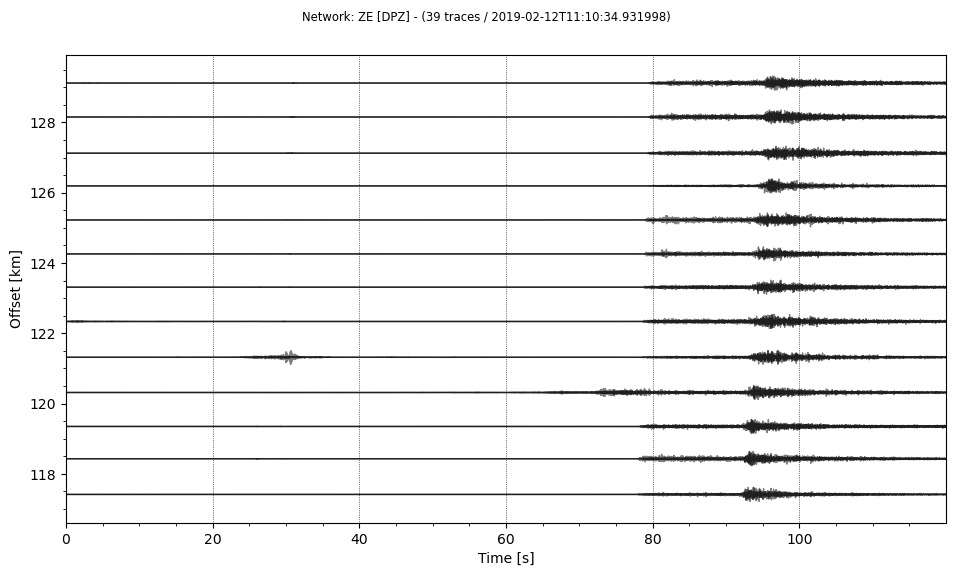

In [12]:
streams[3][0].plot(type="section",ev_coords = (100,100),orientation = "horizontal",outfile="out.png")

## Plotting spectrogram of the third stream which appears to have interesting signals

/home/naalexeev/.conda/envs/denalinodal/lib/python3.10/site-packages/obspy/imaging/spectrogram.py:147: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

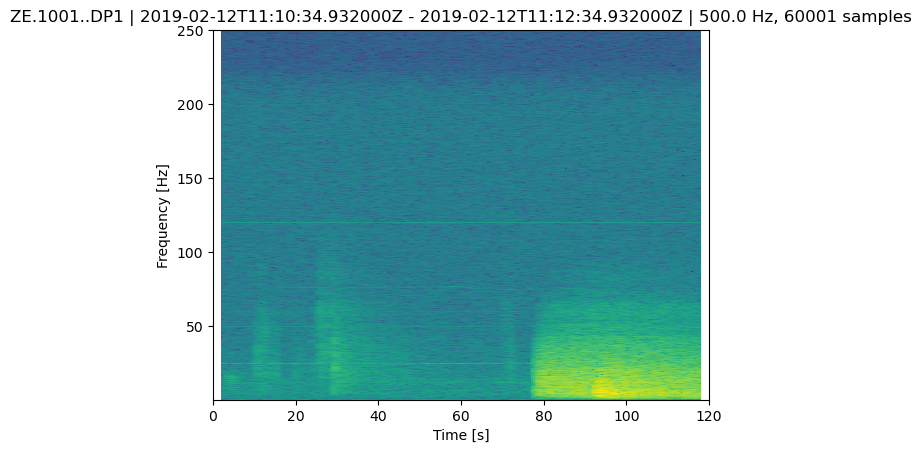

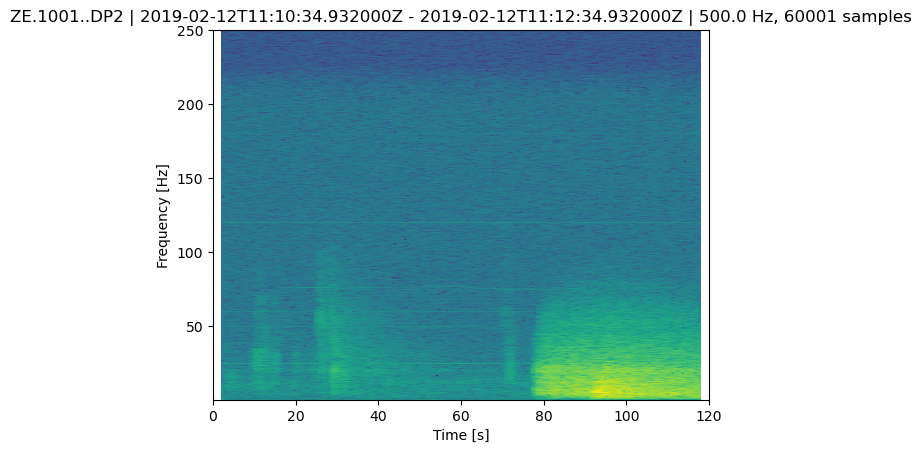

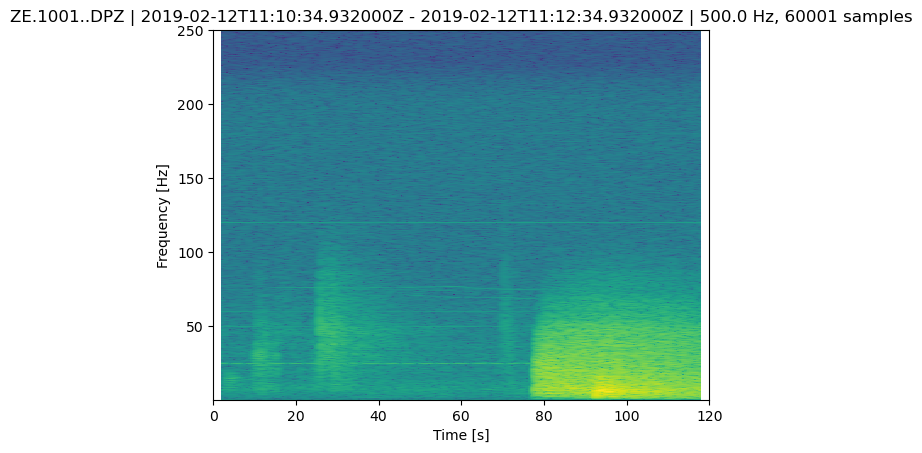

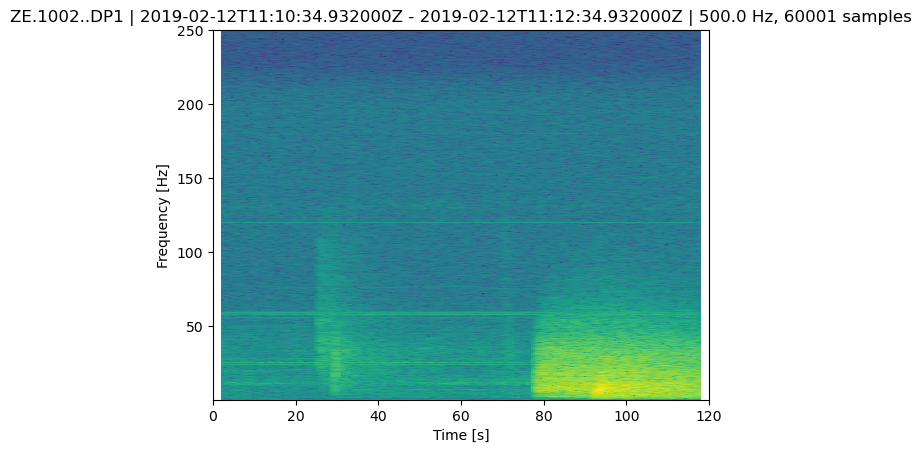

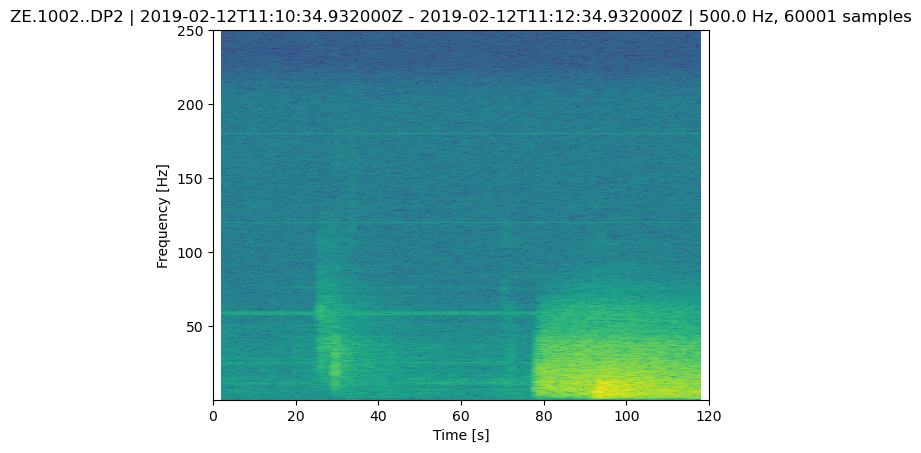

...

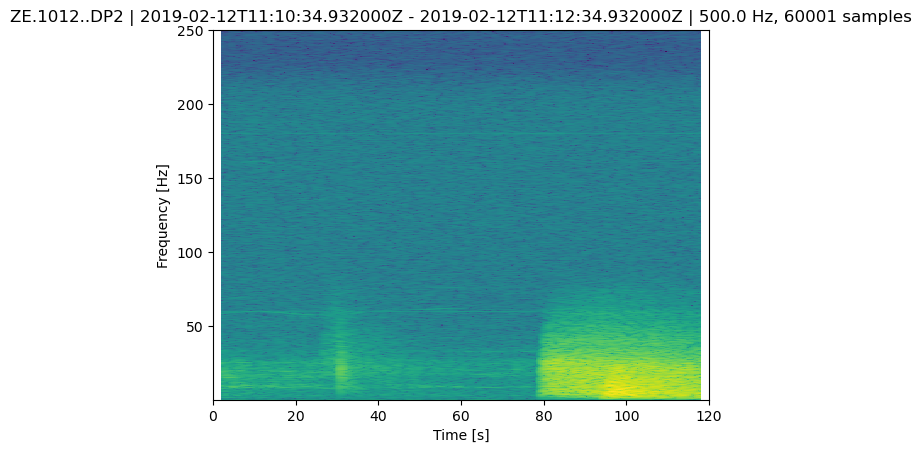

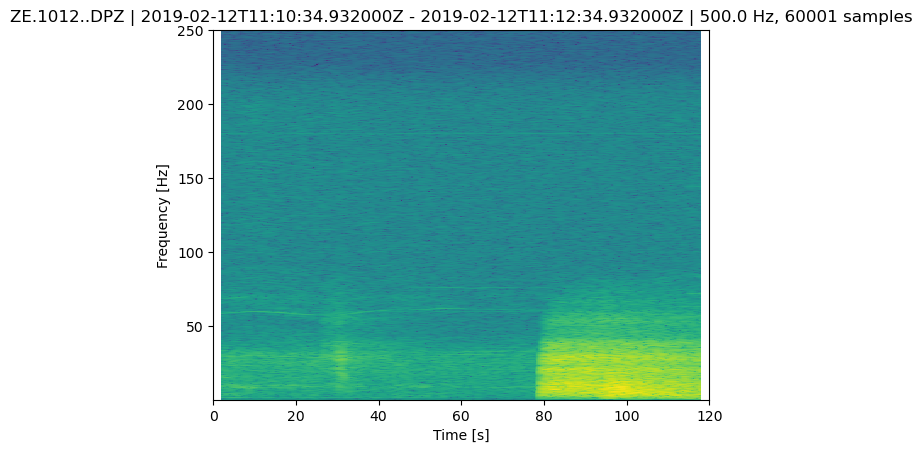

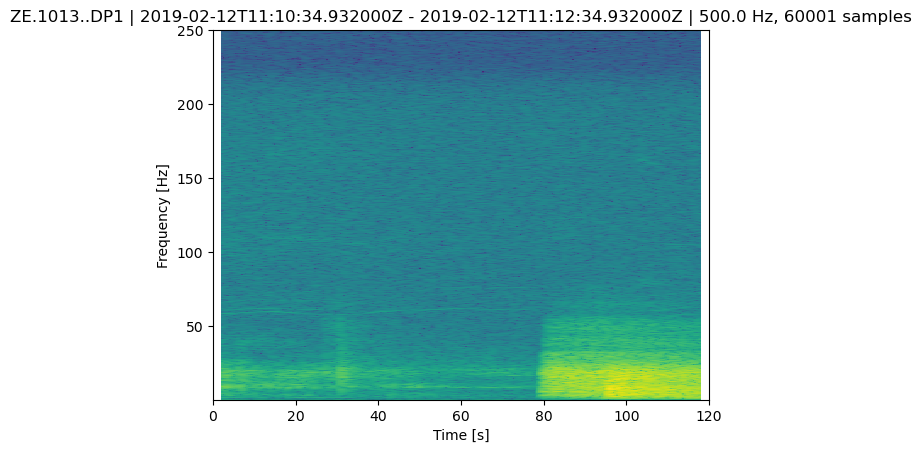

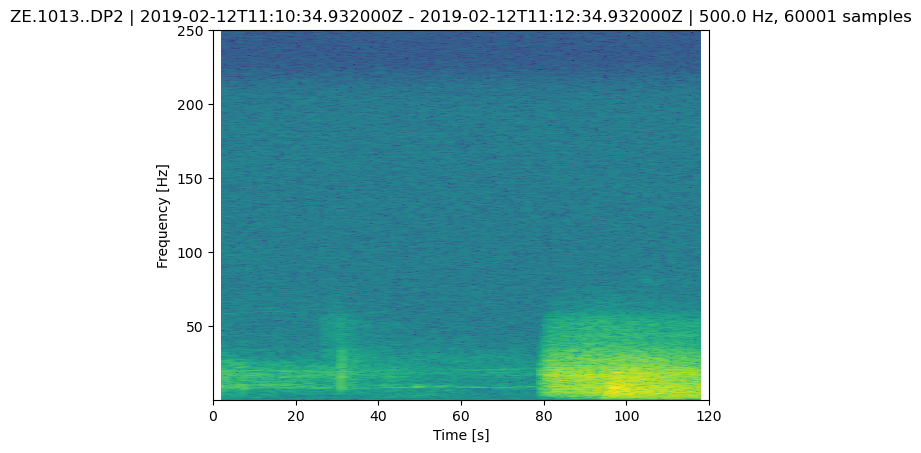

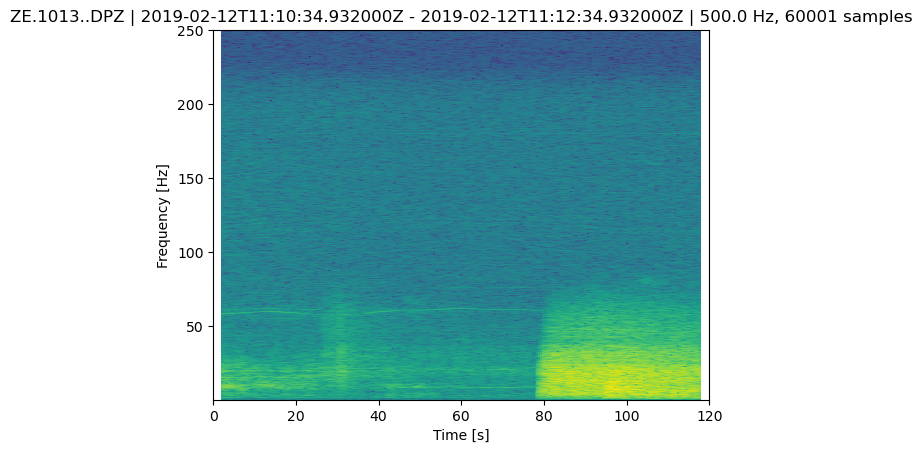

In [13]:
streams[3][0].spectrogram(outfile="spec.png",dbscale=True)

## Playing around with different views of a spectrogram

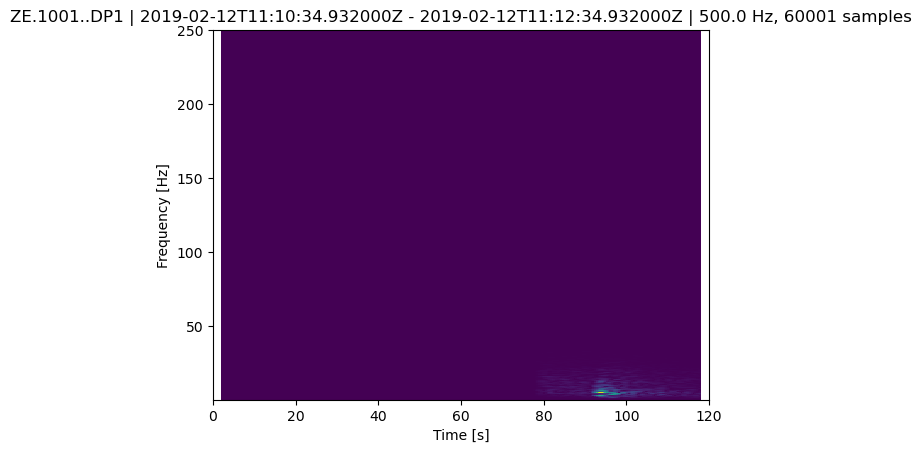

ZE.1001..DP1 | 2019-02-12T11:10:34.932000Z - 2019-02-12T11:12:34.932000Z | 500.0 Hz, 60001 samples


In [14]:
test_tr = streams[3][0][0]
test_tr.spectrogram()
print(test_tr)

In [15]:
numpy_data = test_tr.data
print(numpy_data)

[ -210  -213  -211 ... -2855 -2185 -1607]


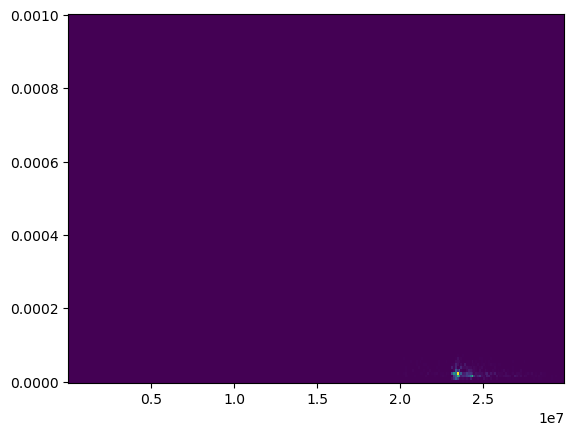

In [16]:
f,t,sxx = signal.spectrogram(numpy_data,fs = 1.0/500.0)
plt.pcolormesh(t,f,sxx)
plt.show()

## Trying to get a sectional like plot for spectrograms.

4.8
39


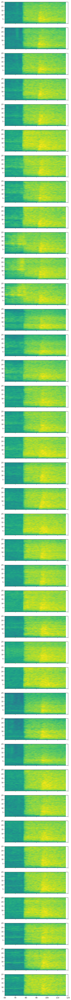

In [17]:
fig, ax = plt.subplots(len(streams[3][0]),1,sharex=True)
print(fig.get_figheight())
fig.set_figheight(100.0)
print(len(streams[3][0]))
i=0

for trace in streams[3][0]:
    a = trace.spectrogram(axes = ax[i],clip = [0.15,1.0],dbscale=True)
    a.set_ylim(top = 25.0)
    a.set_xlim(left=60.0)
    #a.set_ylabel("Frequency (Hz)")
    #a.set_xlabel("Time (s)")
    

    i+=1
plt.show()

## Looking at interesting signal again with different color scaling.

The lines may be some kind of vopject, possibly a train.

4.8
39


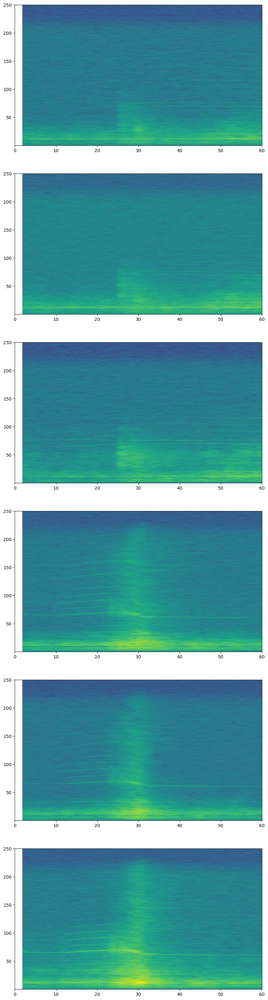

In [18]:
min_fig = 9
max_fig=15
fig, ax = plt.subplots(max_fig-min_fig,1,sharex=False)


print(fig.get_figheight())
fig.set_figheight(40.0)
fig.set_figwidth(10.0)
print(len(streams[3][0]))
h_lines = []
for i in range(0,25):
    h_lines.append(float(i)*10.0)
v_lines = []
for i in range(0,60):
    v_lines.append(float(i))
i=0

for trace in streams[3][0][min_fig:max_fig]:
    a = trace.spectrogram(axes = ax[i],clip = [0.15,1.0],dbscale=True)
    
    #a.set_ylim(top = 25.0)
    a.set_xlim(right=60.0)
    #a.hlines(h_lines,0,60.0,colors=["r"],linestyles="dotted")
    #a.vlines(v_lines,0,250.0,colors=["r"],linestyles="dotted")
    #a.set_ylabel("Frequency (Hz)")
    #a.set_xlabel("Time (s)")
    

    i+=1
plt.show()

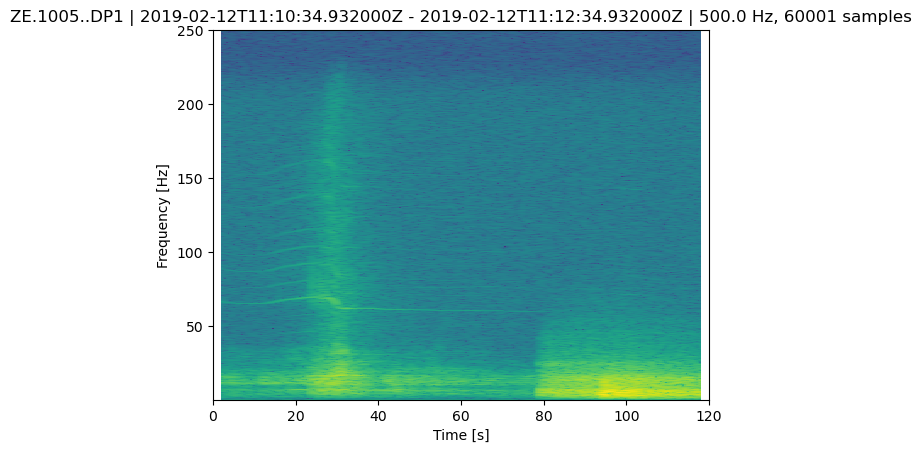

In [19]:
streams[3][0][9+3].spectrogram(clip = [0.15,1.0],dbscale=True)